# Evaluate Interferogram Offsets
---

This notebook demonstrates the functionality of `nisarRIFGHDF`, which is at tool for reading NISAR **RIFG** products.  Some of its functionality is specifically developed for the Greenland Mapping Project (GrIMP) workflows, but it may also be of general use for working with these products. If nothing else, the source code provides examples of how to unpack these projects.

## Python Imports

In [1]:
%load_ext autoreload
%autoreload 2
import nisarhdf
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable
import rioxarray
from osgeo import gdal
from subprocess import call, DEVNULL
import os
import threading
import utilities as u

In [2]:
def autoScaleRange(myVar, percentile):
        '''
        If percentile less than 100, will select vmin as (100-percentile)
        and vmax as percentile of myVar, unless they fall out of the vmin and
        vmax bounds.
        Parameters
        ----------
        myVar : nparray
            Data being displayed.
        vmin : float
            Absolute minimum value.
        vmax : TYPE
            absolute maximum value.
        percentile : TYPE
            Clip data at (100-percentile) and percentile.

        Returns
        -------
        vmin, vmax - updated values based on percentiles.
        '''
        vmax = np.percentile(myVar[np.isfinite(myVar)], percentile)
        vmin = np.percentile(myVar[np.isfinite(myVar)], 100 - percentile)
        return vmin, vmax

In [3]:
def createDivider(ax, colorBarPosition='right', colorBarSize='5%',
                   colorBarPad=0.05):
    '''
    Create divider for color bar
    '''
    divider = make_axes_locatable(ax)  # Create space for colorbar
    return divider.append_axes(colorBarPosition, size=colorBarSize,
                               pad=colorBarPad)

def colorBar(pos, ax, colorBarLabel, colorBarPosition, colorBarSize,
              colorBarPad, labelFontSize, plotFontSize, extend='max',
              fontScale=1):
    '''
    Color bar for image
    '''
    # Create an divided axis for cb
    cbAx = createDivider(ax, colorBarPosition=colorBarPosition,
                             colorBarSize=colorBarSize,
                               colorBarPad=colorBarPad)
    # Select orientation
    orientation = {'right': 'vertical', 'left': 'vertical',
                   'top': 'horizontal',
                   'bottom': 'horizontal'}[colorBarPosition]

    cb = plt.colorbar(pos, cax=cbAx, orientation=orientation,
                      extend=extend)
    cb.set_label(colorBarLabel, size=labelFontSize * fontScale)
    cb.ax.tick_params(labelsize=plotFontSize * fontScale)
    if colorBarPosition in ['right', 'left']:
        cbAx.yaxis.set_ticks_position(colorBarPosition)
        cbAx.yaxis.set_label_position(colorBarPosition)
    elif colorBarPosition in ['top', 'tottom']:
        cbAx.xaxis.set_ticks_position(colorBarPosition)
        cbAx.xaxis.set_label_position(colorBarPosition)

In [4]:
def runInterp(outputDir, inputFile, outputFile, nr, na, ratThresh=1,
              thresh=20, islandThresh=20, padEdges=True,
              stderr=DEVNULL, stdout=DEVNULL, workingDir='workingDir'):
    '''
    Shell call to run interpolator
   ----------
    outputDir : str
        The product directory for final products.
    inputFile : str
        Filename to be interpolated
    outputFile : str
        Filename to be interpolated
    nr : int
        Number of range samples
    na : int
        Number of azimuth samples
    ratThresh : int, optional
        Allows larger skinny holes, best left at default. The default is 1.
    thresh : int, optional
        Fill only holes with area <=thresh. The default is 20.
    islandThresh : int, optional
        Remove isolated areas <= islandThresh pixels. The default is 20.
    stderr : file pointer, optional
        File for stdout output. Use None for stdout. The default is DEVNULL.
    stdout : file pointer, optional
        File for stderr output. Use None for stdout. The default is DEVNULL.
    layers : list, optional
        The layers to include. Only special cases need to use this. The
        default is [1, 2, 3].
    workingDir : str, optional
        The location for all of the intermediate outputs. The default is
        'workingDir'.

    Returns
    -------
    None.

    '''
    extra = ''
    if padEdges:
        extra = '- padEdges -allowBreaks '
    command = f'intfloat {extra} -ratThresh {ratThresh} -wdist -nr {nr} -na {na} -thresh {thresh} ' \
        f'-islandThresh {islandThresh} {outputDir}/{workingDir}/{inputFile} ' \
        f' > {outputDir}/{workingDir}/{outputFile}'
    # print(command)
    #
    # Run command
    call(command, shell=True, executable='/bin/csh', stderr=stderr,
         stdout=stdout)


def interpOffsets(outputDir, baseName, ratThresh=1, thresh=20, islandThresh=20,
                  stderr=DEVNULL, stdout=DEVNULL, padEdges=True, layers=[1, 2, 3],
                  workingDir='workingDir'):
    '''
    Call intfloat to interpolate offsets to do minor hole filling.

    Parameters
    ----------
    outputDir : str
        The product directory for final products.
    baseName : str
        Root name for offsets (e.g., offsets for offsets.layer1.cull.interp.da)
    ratThresh : int, optional
        Allows larger skinny holes, best left at default. The default is 1.
    thresh : int, optional
        Fill only holes with area <=thresh. The default is 20.
    islandThresh : int, optional
        Remove isolated areas <= islandThresh pixels. The default is 20.
    stderr : file pointer, optional
        File for stdout output. Use None for stdout. The default is DEVNULL.
    stdout : file pointer, optional
        File for stderr output. Use None for stdout. The default is DEVNULL.
    layers : list, optional
        The layers to include. Only special cases need to use this. The
        default is [1, 2, 3].
    workingDir : str, optional
        The location for all of the intermediate outputs. The default is
        'workingDir'.

    Returns
    -------
    None.

    '''
    print('Interpolating... ')
    if os.path.exists(f'{outputDir}/{workingDir}/{baseName}.layer3.dat'):
        with open(f'{outputDir}/{workingDir}/{baseName}.layer3.dat', 'r') as fp:
            line = fp.readlines()[0].split()
            nr, na = int(line[2]), int(line[3])
    kwargs = {'ratThresh': ratThresh, 'thresh': thresh,
              'islandThresh': islandThresh, 'stderr': stderr, 'stdout': stdout,
              'workingDir': workingDir, 'padEdges': padEdges}
    threads = []
    # for historical resasons sr, sa don't have cull in the name
    inputSuffixes = ['cull.dr', 'cull.da', 'sr', 'sa']
    # Make all output have consistent names
    outputSuffixes = ['cull.interp.dr', 'cull.interp.da', 'cull.interp.sr',
                      'cull.interp.sa']
    #
    for inputSuffix, outputSuffix in zip(inputSuffixes, outputSuffixes):
        for layer in layers:
            inputFile = f'{baseName}.layer{layer}.{inputSuffix}'
            outputFile = f'{baseName}.layer{layer}.{outputSuffix}'
            threads.append(
                threading.Thread(target=runInterp,
                                 args=[outputDir, inputFile, outputFile,
                                       nr, na],
                                 kwargs=kwargs))
    # Run the interpolation
    quiet = False
    if stdout == DEVNULL:
        quiet = True
    u.runMyThreads(threads, len(layers) * 4, 'interpolating', quiet=quiet)
    #
    # Write the correponding vrt
    descriptions = ['RangeOffsets', 'AzimuthOffsets', 'RangeSigma',
                    'AzimuthSigma']
    for layer in layers:
        sourceFiles = [f'{baseName}.layer{layer}.cull.interp{suffix}'
                       for suffix in ['.dr', '.da', '.sr', '.sa']]
        #
        vrtFile = \
            f'{outputDir}/{workingDir}/{baseName}.layer{layer}.cull.interp.vrt'

        nisarhdf.writeMultiBandVrt(vrtFile, nr, na, sourceFiles, descriptions,
                                  byteOrder='MSB', eType=gdal.GDT_Float32,
                                  geoTransform=[-0.5, 1., 0., -0.5, 0., 1.], metaData={},
                                  epsg=None, noDataValue=-2.0e9, tiff=False)


## Open the HDF

Edit the path below to point to the ROFF product you wish to work with.

In [5]:
RIFGFile = '/Volumes/insar1/ian/NISAR/frame_280/insar/products/RIFG_ALOS2496725280-230804_ALOS2498795280-230818.h5'

Create an instance and open the hdf as shown below. For normal products, you shouldn't have to specify the orbit, but while the orbit fields are present in the example file, they are not populated. When you open the hdf, you can specify the precise orbit XMLs if desired, which are release a few weeks after the MOI orbits used in the processing.

In [6]:
myRIFG= nisarhdf.nisarRIFGHDF()
myRIFG.openHDF(RIFGFile , referenceOrbitXML=None, secondaryOrbitXML=None,
               referenceOrbit=49672, secondaryOrbit=49879, frame=5280)

ref orbit None
Could not open with page_buf_size, opening for non-optimized access
RIFG referenceZeroDopplerStartTime
alongTrackOffset
(1996, 857)
slantRangeOffset
(1996, 857)
correlationSurfacePeak
(1996, 857)
<class 'nisarhdf.nisarBaseHDF.pixelOffsets'>
[660125.36660615]
ref orbit None
Cannot sread secondary orbit yet
RIFG secondaryZeroDopplerStartTime
[660048.014999]


## Display Data

The interferogram data is displayed below. Note the low correlation values in the upper right corners, that leave islands no fringes in the interferograms. 

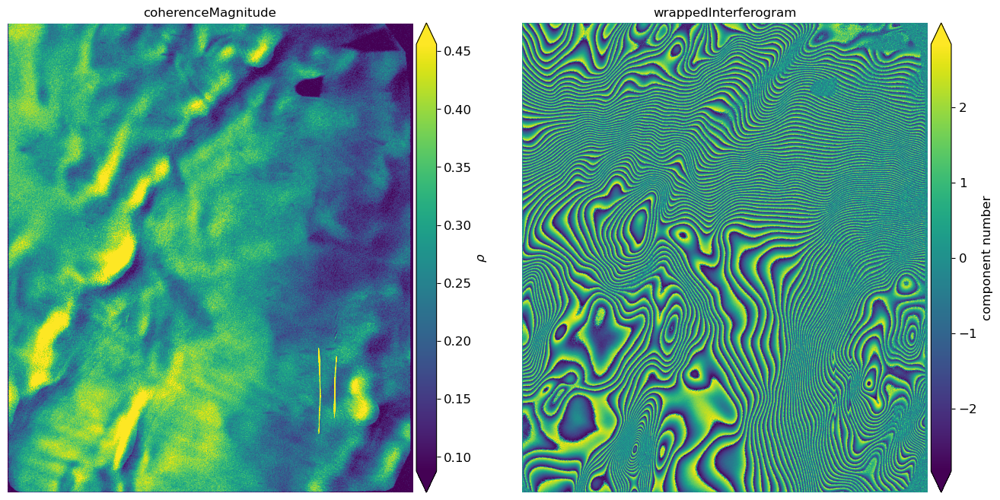

In [7]:
fields = myRIFG.dataFields 
labels = dict(zip(fields, ['$\\rho$', 'component number', 'phase (rad)', '$\\sigma$ (rad)', 'phase (rad)']))
fig, axes = plt.subplots(1, len(fields), figsize=(16, 10))
for field, ax in zip(fields, axes.flatten()):
    data = getattr(myRIFG, field)    
    if field == 'wrappedInterferogram':
        data = np.angle(data)
    vmin, vmax = autoScaleRange(data, 95)
    h = ax.imshow(data, vmin=vmin, vmax=vmax, origin='lower')
    colorBar(h, ax, labels[field], 'right', '5%',.05, 12, 12, extend='both')
    ax.set_title(field)
    ax.axis('off')

The wrapped offsets used to compute the interferogram are shown below, and the there clear artifacts in the areas identified above.

0.04254128932952881 0.9523676872253417
0.04483015537261963 0.9504980564117431
0.07301486805081367 0.16299624666571616


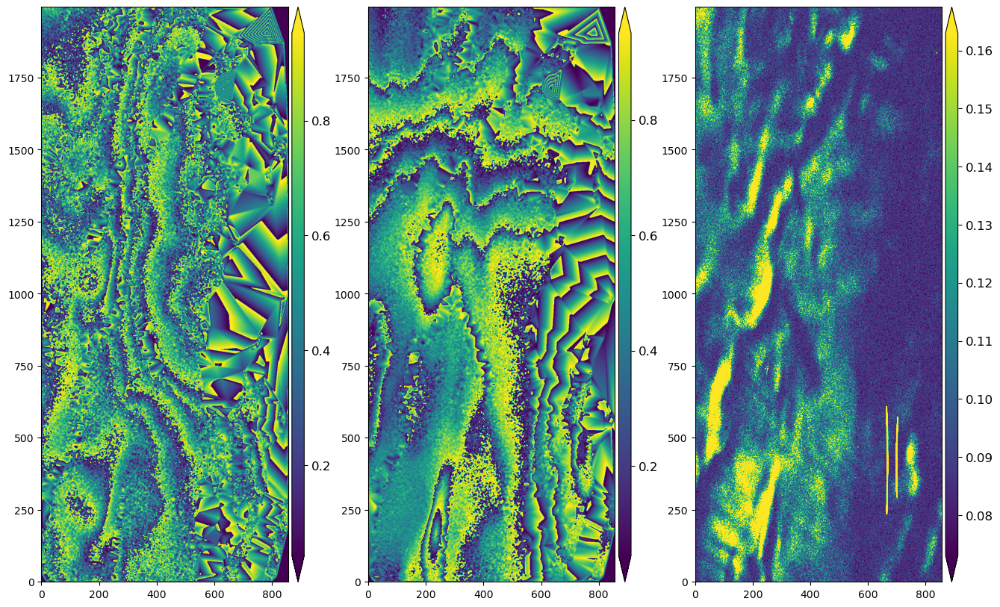

In [8]:
fig, axes = plt.subplots(1, len(myRIFG.pixelOffsets.dataFields), figsize=(16, 10))
for field, ax in zip(myRIFG.pixelOffsets.dataFields, axes.flatten()):
    data =   getattr(myRIFG.pixelOffsets, field) % 1
    vmin, vmax = autoScaleRange(data, 95)
    print(vmin,vmax)
    h = ax.imshow(data, vmin=vmin, vmax=vmax, origin='lower')
    colorBar(h, ax, '', 'right', '5%',.05, 12, 12, extend='both')

## An Alternate Interpolation

### Step 1: Load the Offset Data

Read in the ROFF data.

In [9]:
ROFFFile = '/Volumes/insar1/ian/NISAR/frame_280/insar/products/ROFF_ALOS2496725280-230804_ALOS2498795280-230818.h5'

In [10]:
myROFF = nisarhdf.nisarROFFHDF()
myROFF.openHDF(ROFFFile , referenceOrbitXML=None, secondaryOrbitXML=None,
               referenceOrbit=49672, secondaryOrbit=49879)

ROFF referenceZeroDopplerStartTime


slantRangeOffset
slantRangeOffsetVariance
alongTrackOffset
alongTrackOffsetVariance
crossOffsetVariance
correlationSurfacePeak
snr


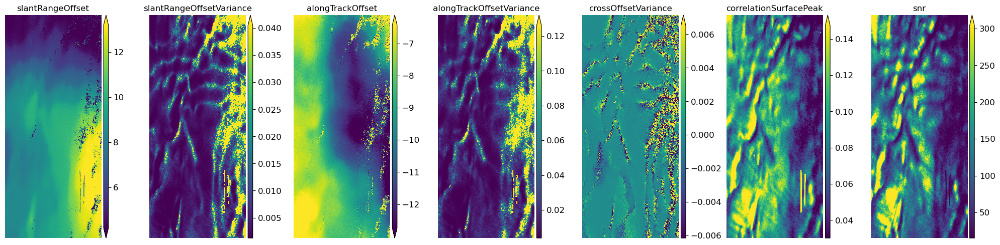

In [11]:
fig, axes = plt.subplots(1, 7, figsize=(20, 5))
cbarExtend = ['both', 'max', 'both', 'max', 'max', 'max', 'max']
fields = myROFF.dataFields 
layer = 3
for field, ax, cbE in zip(fields, axes, cbarExtend):
    # Extract the data for each field, but skip the DEM
    if field == 'digitalElevationModel':
        continue
    print(field)
    data = np.squeeze(getattr(myROFF, field)[layer-1])
    # threshold at top and bottom 5%
    vmin, vmax = autoScaleRange(data, 95)
    h = ax.imshow(data, vmin=vmin, vmax=vmax, origin='lower')
    colorBar(h, ax, '', 'right', '5%',.05, 12, 12, extend=cbE)
    ax.set_title(field)
    ax.axis('off')
fig.tight_layout()

### Step 2 Threshold Remove Outliers

Use a threshold to screen obvious outliers. Here the correlation is used, but snr or something else could be used. Both work about as well, but they need to be tuned to the window size.

In [12]:
myROFF.removeOutlierOffsets('correlationSurfacePeak', thresholds=[0.07, 0.06, 0.025], layers=[1, 2, 3])

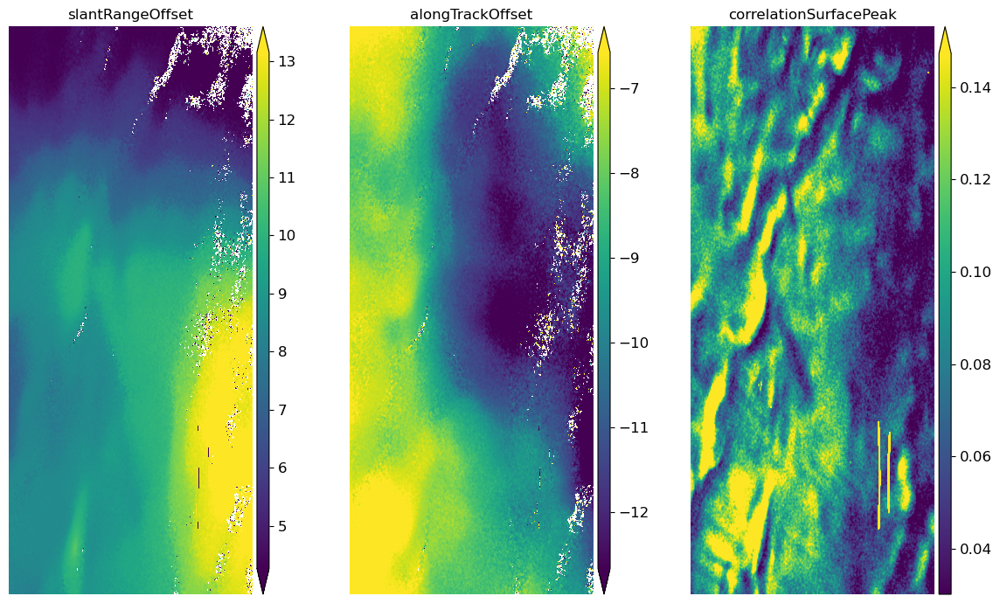

In [13]:
fields = ['slantRangeOffset', 'alongTrackOffset', 'correlationSurfacePeak']
cbarExtend = ['both', 'both', 'max']
fig, axes = plt.subplots(1, 3, figsize=(12, 7))
layer = 3
for field, ax, cbE in zip(fields, axes, cbarExtend):
    # Extract the data for each field
    data = np.squeeze(getattr(myROFF, field)[layer-1])
    # threshold at top and bottom 5%
    vmin, vmax = autoScaleRange(data, 95)
    h = ax.imshow(data, vmin=vmin, vmax=vmax, interpolation='none', origin='lower')
    colorBar(h, ax, '', 'right', '5%',.05, 12, 12, extend=cbE)
    ax.set_title(field)
    ax.axis('off')
fig.tight_layout()

No matter how the threshold is selected, outliers always remain.

### Step 3: Advanced Culling

First dump the layers to bindary files that the GrIMP culler can read.

In [14]:
myROFF.writeData('workingDir/ROFF', bands=['slantRangeOffset', 'alongTrackOffset', 'correlationSurfacePeak'], tiff=False, byteOrder='MSB', grimp=True, saveMatch=True)

In [15]:
!ls workingDir

ROFF.layer1.cc	    ROFF.layer2.mt.vrt		 ROFF.layer3.cull.mt.vrt
ROFF.layer1.da	    ROFF.layer2.vrt		 ROFF.layer3.cull.vrt
ROFF.layer1.dat     ROFF.layer3.cc		 ROFF.layer3.da
ROFF.layer1.dr	    ROFF.layer3.cull.cc		 ROFF.layer3.dat
ROFF.layer1.mt	    ROFF.layer3.cull.da		 ROFF.layer3.dr
ROFF.layer1.mt.vrt  ROFF.layer3.cull.dr		 ROFF.layer3.mt
ROFF.layer1.vrt     ROFF.layer3.cull.interp.da	 ROFF.layer3.mt.vrt
ROFF.layer2.cc	    ROFF.layer3.cull.interp.dr	 ROFF.layer3.sa
ROFF.layer2.da	    ROFF.layer3.cull.interp.sa	 ROFF.layer3.sr
ROFF.layer2.dat     ROFF.layer3.cull.interp.sr	 ROFF.layer3.vrt
ROFF.layer2.dr	    ROFF.layer3.cull.interp.vrt
ROFF.layer2.mt	    ROFF.layer3.cull.mt


Use only the best layer, layer3, and cull that with the GrIMP culler. This tool does the following:

* Examines the neighborhood in a box around each pixel (`boxSize`x`boxSize`),
* Fits a plane to the data and removes it,
* Discards outliers larger than some threshold (`maxR` and `maxA`),
* Discards points with few nearby good samples (must have > 'nGood` good samples in neighborhood),
* Estimates the sigma for the remaining samples (subtracts 3 from N to account for the plane fit),
* Averages the surounding pixels (`sr`x`sa`),
* Scales the estimated sigmas to account for the averaging.
* Removes any connected set of points that has area <= `islandThresh` as determined by the connected components for a binary with/without data mask.

In [16]:
boxSize=9
maxA=3
maxR=3
nGood=17
sa=7
sr=7
islandThresh=20
!cullst  -boxSize {boxSize} -maxA {maxA} -maxR {maxR} -nGood {nGood} -sa {sa}  -sr {sr}  workingDir/ROFF.layer3  workingDir/ROFF.layer3.cull 

|workingDir/ROFF.layer3|
|workingDir/ROFF.layer3.cull|
Infiles: 
 workingDir/ROFF.layer3.dr
 workingDir/ROFF.layer3.da
 workingDir/ROFF.layer3.cc
 workingDir/ROFF.layer3.dat
 workingDir/ROFF.layer3.mt
Outfiles: 
 workingDir/ROFF.layer3.cull.dr
 workingDir/ROFF.layer3.cull.da
 workingDir/ROFF.layer3.cull.cc
 workingDir/ROFF.layer3.cull.dat
 workingDir/ROFF.layer3.cull.mt
cullIslandThresh -1
Entering loadcull ...
Found VRT, reading that ...
a0=266
bands=['slantRangeOffset', 'alongTrackOffset', 'correlationSurfacePeak']
ByteOrder=MSB
datetime=2023-08-04 14:57:47.166045
deltaA=15
deltaR=30
epsg=3031
frame=0
geo1=None
geo2=None
LookDirection=right
OffsetAzimuthPixelSize=34.07459178613978
OffsetAzimuthSize=1996
OffsetFirstZeroDopplerTime=53867.25322284346
OffsetIncidenceCenter=39.840231013107314
OffsetNearRange=815017.492315702
OffsetRangePixelSize=42.91266718443529
OffsetRangeSize=857
OffsetZeroDopplerTimeSpacing=0.004916043803916711
PassType=descending
PRF=3051.234
r0=266
referenceGranule=

<xarray.Dataset>
Dimensions:         (x: 857, y: 1996)
Coordinates:
  * x               (x) float64 0.0 1.0 2.0 3.0 4.0 ... 853.0 854.0 855.0 856.0
  * y               (y) float64 0.0 1.0 2.0 ... 1.993e+03 1.994e+03 1.995e+03
    spatial_ref     int64 0
Data variables:
    RangeOffsets    (y, x) float32 8.453 8.449 8.443 8.449 ... nan nan nan nan
    AzimuthOffsets  (y, x) float32 -4.531 -4.539 -4.544 -4.579 ... nan nan nan
    RangeSigma      (y, x) float32 ...
    AzimuthSigma    (y, x) float32 ...
    Correlation     (y, x) float32 0.04668 0.04664 0.04559 ... 0.02072 0.02137
Attributes: (12/40)
    a0:                            266
    bands:                         ['slantRangeOffset', 'alongTrackOffset', '...
    boxSize:                       9
    ByteOrder:                     MSB
    corrThresh:                    0.0
    datetime:                      2023-08-04 14:57:47.166045
    ...                            ...
    SLCFarRange:                   852284.282920905
    SLCFirstZeroDopplerTime:       53867.166045
    SLCLastZeroDopplerTime:        53877.165933569675
    SLCNearRange:                  814637.0
    sR:                            7
    Wavelength:                    0.23840349999999996

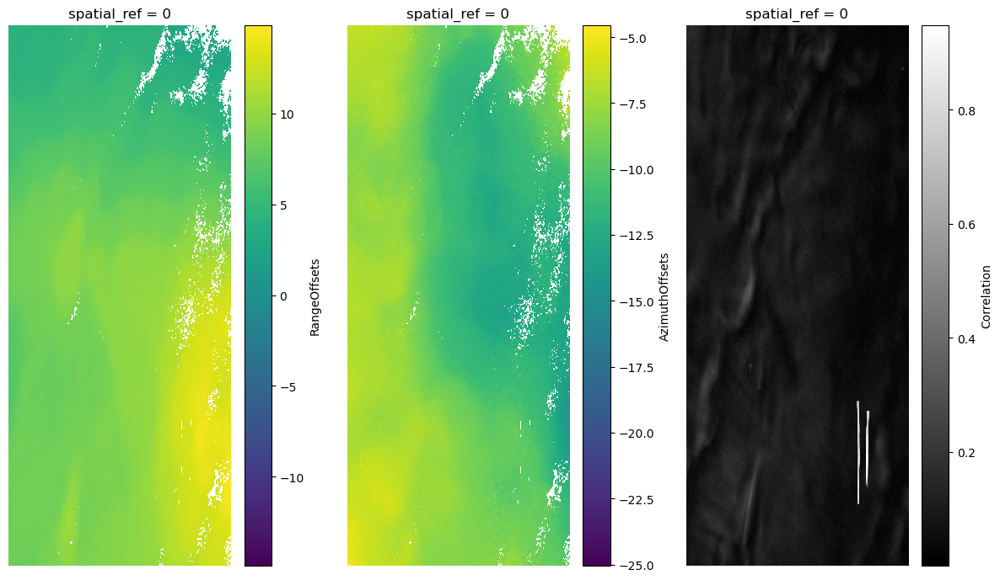

In [17]:
layer3 = nisarhdf.readVrtAsXarray('workingDir/ROFF.layer3.cull.vrt', mask_and_scale=True)
fig, axes = plt.subplots(1, 3, figsize=(12, 7))
layer3.RangeOffsets.plot.imshow(ax=axes[0], interpolation='none', cmap='viridis')
layer3.AzimuthOffsets.plot.imshow(ax=axes[1], interpolation='none', cmap='viridis')
layer3.Correlation.plot.imshow(ax=axes[2], cmap='gray')
for ax in axes.flatten():
    ax.axis('off')
fig.tight_layout()
layer3

Unlike the intially culled results, there are few if any obvious outliers. 

### Step 4: Interpolate the results

The GrIMP interpolator creates a mask of the holes and the runs a connected components algorithm. As a result, the decision to interpolate can be made based on the properties of the hole rather than than the point in th hole. For example, for making a velocity map, only holes < 20 pixels are filled, to get rid of the 'pin-prick' holes. For making an interferogram, much larger holes can be filled because the result needs to be just good enough to get good correlation. By working with the "hole" insted of the "point", a weighted-distance interpolator can be used, that uses all the points on the boundary of the hole. For ice streams, often there are long, skinny holes along shear margins, so there is some ability to decide whether to interpolate based on the aspect ratio of the hole.

In [18]:
interpOffsets('.', 'ROFF', ratThresh=1, thresh=50000, islandThresh=20, padEdges=False, stderr=DEVNULL, stdout=DEVNULL, layers=[3], workingDir='workingDir')

Interpolating... 


In [19]:
!ls workingDir

ROFF.layer1.cc	    ROFF.layer2.mt.vrt		 ROFF.layer3.cull.mt.vrt
ROFF.layer1.da	    ROFF.layer2.vrt		 ROFF.layer3.cull.vrt
ROFF.layer1.dat     ROFF.layer3.cc		 ROFF.layer3.da
ROFF.layer1.dr	    ROFF.layer3.cull.cc		 ROFF.layer3.dat
ROFF.layer1.mt	    ROFF.layer3.cull.da		 ROFF.layer3.dr
ROFF.layer1.mt.vrt  ROFF.layer3.cull.dr		 ROFF.layer3.mt
ROFF.layer1.vrt     ROFF.layer3.cull.interp.da	 ROFF.layer3.mt.vrt
ROFF.layer2.cc	    ROFF.layer3.cull.interp.dr	 ROFF.layer3.sa
ROFF.layer2.da	    ROFF.layer3.cull.interp.sa	 ROFF.layer3.sr
ROFF.layer2.dat     ROFF.layer3.cull.interp.sr	 ROFF.layer3.vrt
ROFF.layer2.dr	    ROFF.layer3.cull.interp.vrt
ROFF.layer2.mt	    ROFF.layer3.cull.mt


## Side by Side Comparison

Here are the results plotted side by side and wrapped by 1 to better display noise.

alongTrackOffset
slantRangeOffset


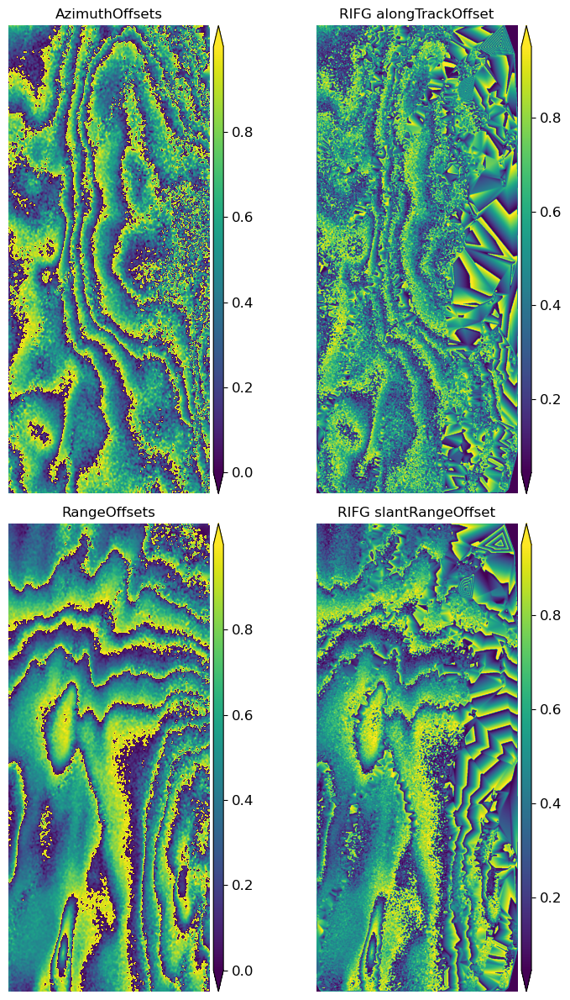

In [20]:
layer3 = nisarhdf.readVrtAsXarray('workingDir/ROFF.layer3.cull.interp.vrt', mask_and_scale=True)
fig, axes = plt.subplots(2, 2, figsize=(8, 12))
for field, ax in zip(['AzimuthOffsets', 'RangeOffsets'], axes[:, 0]):
    data =   getattr(layer3, field) % 1
    h = ax.imshow(data, interpolation='none', cmap='viridis', origin='lower')
    ax.axis('off')
    ax.set_title(field)
    colorBar(h, ax, '', 'right', '5%',.05, 12, 12, extend='both')
for field, ax in zip(myRIFG.pixelOffsets.dataFields, axes[:, 1].flatten()):
    data =   getattr(myRIFG.pixelOffsets, field) % 1
    print(field)
    vmin, vmax = autoScaleRange(data, 95)
    h = ax.imshow(data, vmin=vmin, vmax=vmax, origin='lower')
    colorBar(h, ax, '', 'right', '5%',.05, 12, 12, extend='both')
    ax.axis('off')
    ax.set_title(f'RIFG {field}')
fig.tight_layout()


There results on the left will clearly produce a better interferogram due to the additonal smoothing (7x7 moving average), better culling, and more robust hole filling. The really large values in the upper right corner have eliminated.